In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

/var/folders/dm/0dxvnrc93q19zgnvw_vyjg940000gn/T/ipykernel_25305/1051061552.py:3: DtypeWarning:

Columns (18,21,22,24,29,30,36,48,52,54,59,60,93,97,99,104,105) have mixed types. Specify dtype option on import or set low_memory=False.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:10

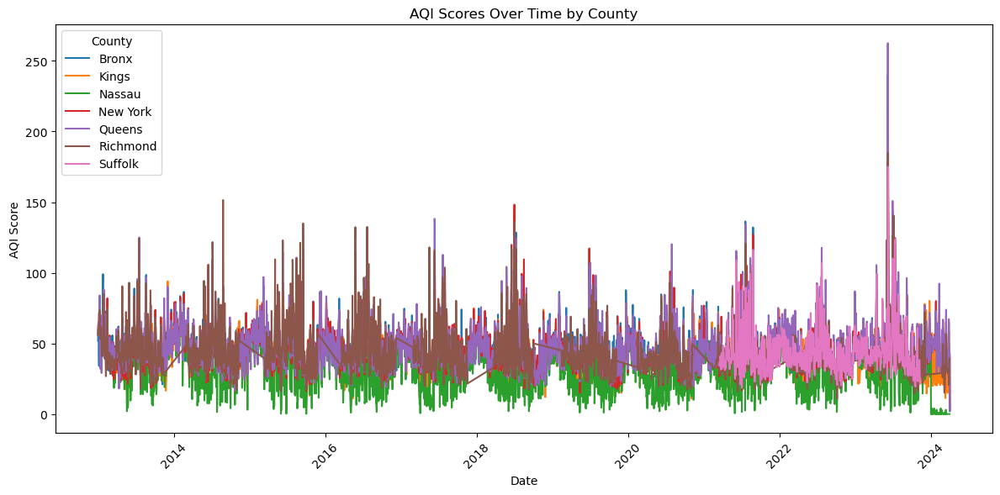

In [16]:
#Time Series Plot of AQI Scores:
# Load the data
df = pd.read_csv('Resources/consolidated_seven_ny_counties.csv')
df['date_local'] = pd.to_datetime(df['date_local'])
df = df.drop(['county_code_81102', 'parameter_code_81102', 'parameter_81102', 'latitude_81102',\
              'longitude_81102', 'sample_duration_code_81102', 'units_of_measure_81102', 'observation_count_81102',\
              'validity_indicator_81102', 'arithmetic_mean_81102', 'first_max_value_81102', 'first_max_hour_81102',\
              'aqi_81102', 'county_81102', 'city_81102'], axis = 1) 

plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='date_local', y='aqi_max', hue='county')
plt.title('AQI Scores Over Time by County')
plt.xlabel('Date')
plt.ylabel('AQI Score')
plt.xticks(rotation=45)
plt.legend(title='County')
plt.tight_layout()
plt.show()

In [17]:
'''
Time Series Plot of AQI Scores:
This visualization shows the AQI (Air Quality Index) scores over time for different counties.
Analysis:
Temporal Trends: Look for any overall trends in AQI scores. Are they increasing, decreasing, 
or remaining stable over time?
Seasonal Patterns: Observe if there are recurring patterns in different seasons. For example, 
higher AQI scores in summer months could indicate increased ozone levels due to higher temperatures.
County Comparisons: Compare the lines for different counties. Some counties may consistently have 
higher or lower AQI scores than others.
Extreme Events: Look for any spikes in AQI scores, which could indicate pollution events or unusual weather conditions.
Data Gaps: Any breaks in the lines could indicate missing data for certain periods.

'''

'\nTime Series Plot of AQI Scores:\nThis visualization shows the AQI (Air Quality Index) scores over time for different counties.\nAnalysis:\nTemporal Trends: Look for any overall trends in AQI scores. Are they increasing, decreasing, \nor remaining stable over time?\nSeasonal Patterns: Observe if there are recurring patterns in different seasons. For example, \nhigher AQI scores in summer months could indicate increased ozone levels due to higher temperatures.\nCounty Comparisons: Compare the lines for different counties. Some counties may consistently have \nhigher or lower AQI scores than others.\nExtreme Events: Look for any spikes in AQI scores, which could indicate pollution events or unusual weather conditions.\nData Gaps: Any breaks in the lines could indicate missing data for certain periods.\n\n'

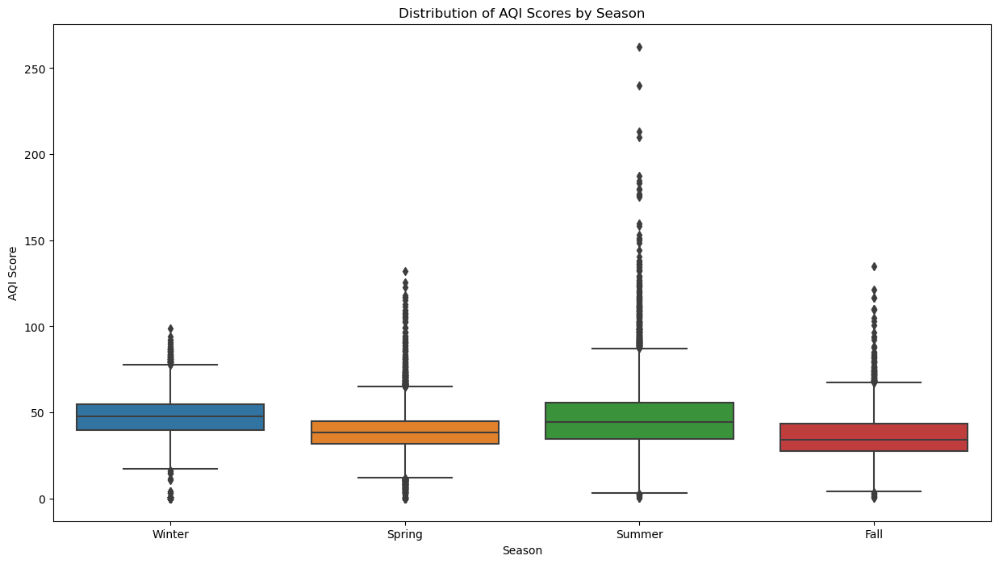

In [18]:
# Alternative visualization for time series
df['date_local'] = pd.to_datetime(df['date_local'])
df['month'] = df['date_local'].dt.month
df['season'] = df['date_local'].dt.month.map({12:1, 1:1, 2:1, 3:2, 4:2, 5:2, 6:3, 7:3, 8:3, 9:4, 10:4, 11:4})
season_names = {1:'Winter', 2:'Spring', 3:'Summer', 4:'Fall'}

plt.figure(figsize=(15, 8))
sns.boxplot(x='season', y='aqi_max', data=df)
plt.title('Distribution of AQI Scores by Season')
plt.xlabel('Season')
plt.ylabel('AQI Score')
plt.xticks([0, 1, 2, 3], [season_names[i] for i in range(1, 5)])
plt.show()

In [19]:
'''

Seasonal Variation: Compare the median (middle line of each box) across seasons. 
Higher medians indicate worse air quality.
Variability: The size of each box represents the interquartile range. 
Larger boxes suggest more variable air quality within that season.
Outliers: Points beyond the whiskers are outliers, representing unusually high AQI scores. 
More outliers in a season suggest more frequent pollution events.
Seasonal Patterns: Look for patterns such as higher AQI scores in summer (potentially due to increased ozone) 
or winter (possibly due to increased particulate matter from heating).

'''

'\n\nSeasonal Variation: Compare the median (middle line of each box) across seasons. \nHigher medians indicate worse air quality.\nVariability: The size of each box represents the interquartile range. \nLarger boxes suggest more variable air quality within that season.\nOutliers: Points beyond the whiskers are outliers, representing unusually high AQI scores. \nMore outliers in a season suggest more frequent pollution events.\nSeasonal Patterns: Look for patterns such as higher AQI scores in summer (potentially due to increased ozone) \nor winter (possibly due to increased particulate matter from heating).\n\n'

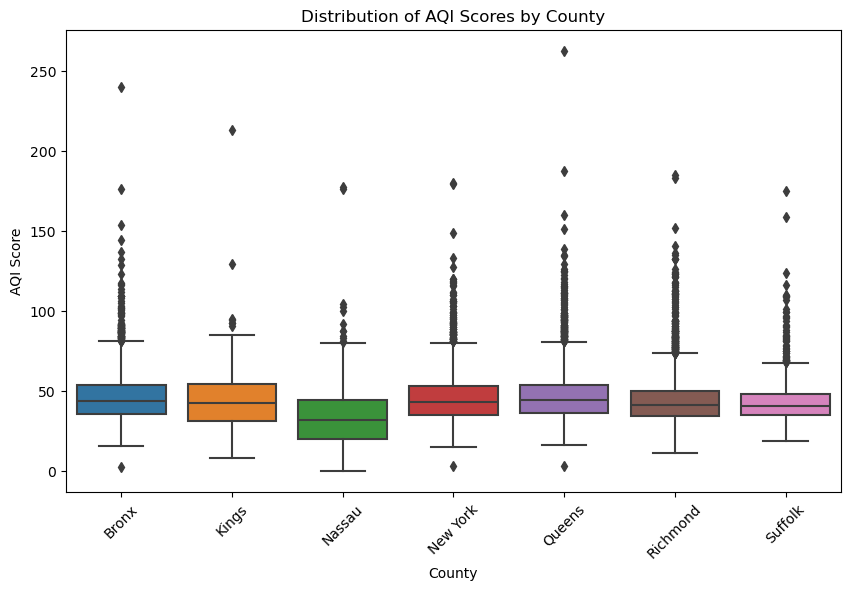

In [20]:
#Box Plot of AQI Scores by County:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='county', y='aqi_max')
plt.title('Distribution of AQI Scores by County')
plt.xlabel('County')
plt.ylabel('AQI Score')
plt.xticks(rotation=45)
plt.show()

In [21]:
'''
Box Plot of AQI Scores by County:
This plot shows the distribution of AQI scores for each county.
Analysis:
Median Levels: The line in the middle of each box represents the median AQI score for that county. 
Compare these to see which counties typically have higher or lower air quality.
Variability: The size of each box represents the interquartile range (IQR). 
Larger boxes indicate more variability in AQI scores.
Outliers: Points beyond the whiskers are outliers, representing unusually high or low AQI scores. 
Counties with more outliers may experience more frequent pollution events.
Overall Comparison: This plot allows for an easy comparison of air quality across counties, 
showing both typical values and the range of scores experienced.

'''

'\nBox Plot of AQI Scores by County:\nThis plot shows the distribution of AQI scores for each county.\nAnalysis:\nMedian Levels: The line in the middle of each box represents the median AQI score for that county. \nCompare these to see which counties typically have higher or lower air quality.\nVariability: The size of each box represents the interquartile range (IQR). \nLarger boxes indicate more variability in AQI scores.\nOutliers: Points beyond the whiskers are outliers, representing unusually high or low AQI scores. \nCounties with more outliers may experience more frequent pollution events.\nOverall Comparison: This plot allows for an easy comparison of air quality across counties, \nshowing both typical values and the range of scores experienced.\n\n'

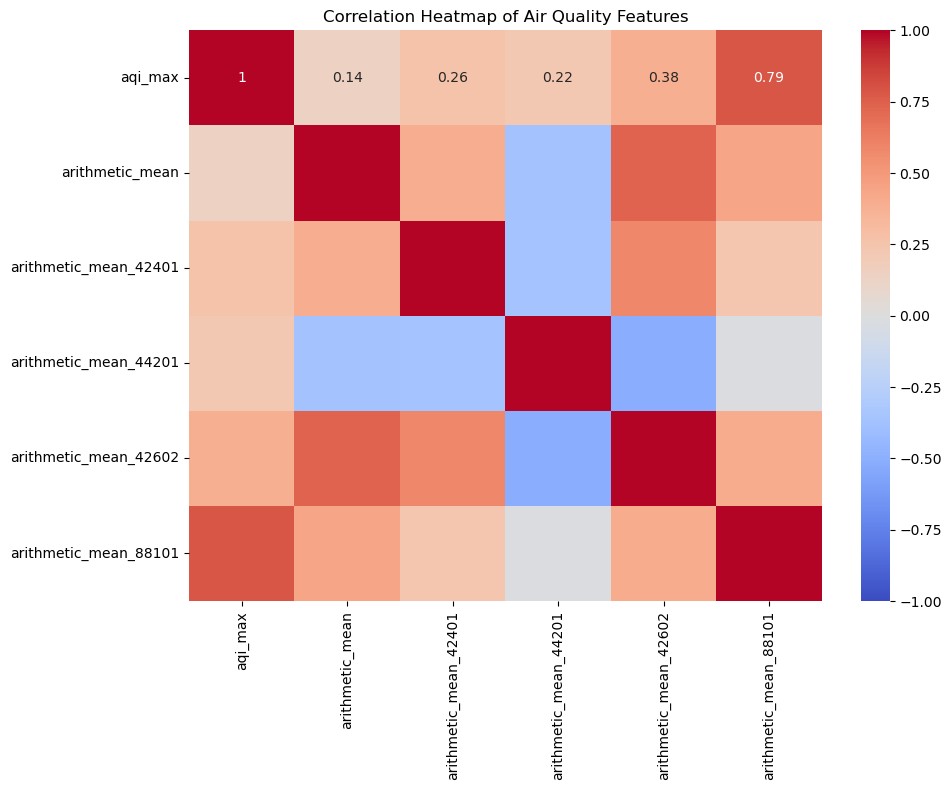

In [22]:
#Heatmap of Correlation Matrix:

correlation_columns = ['aqi_max', 'arithmetic_mean', 'arithmetic_mean_42401', 'arithmetic_mean_44201', 'arithmetic_mean_42602', 'arithmetic_mean_88101']
correlation_matrix = df[correlation_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of Air Quality Features')
plt.tight_layout()
plt.show()

In [23]:
'''
Heatmap of Correlation Matrix:
This heatmap shows the correlations between different air quality measures.
Analysis:
Strong Positive Correlations: Look for dark red squares, indicating strong positive correlations. 
These suggest that as one measure increases, the other tends to increase as well.
Strong Negative Correlations: Dark blue squares indicate strong negative correlations, 
where one measure tends to decrease as the other increases.
Pollutant Relationships: Observe how different pollutants relate to each other. 
For example, a strong correlation between PM2.5 and AQI max would indicate that 
particulate matter strongly influences the overall air quality index.
Independence: Measures with correlations close to zero (light colors) 
suggest little relationship between those pollutants.

'''

'\nHeatmap of Correlation Matrix:\nThis heatmap shows the correlations between different air quality measures.\nAnalysis:\nStrong Positive Correlations: Look for dark red squares, indicating strong positive correlations. \nThese suggest that as one measure increases, the other tends to increase as well.\nStrong Negative Correlations: Dark blue squares indicate strong negative correlations, \nwhere one measure tends to decrease as the other increases.\nPollutant Relationships: Observe how different pollutants relate to each other. \nFor example, a strong correlation between PM2.5 and AQI max would indicate that \nparticulate matter strongly influences the overall air quality index.\nIndependence: Measures with correlations close to zero (light colors) \nsuggest little relationship between those pollutants.\n\n'

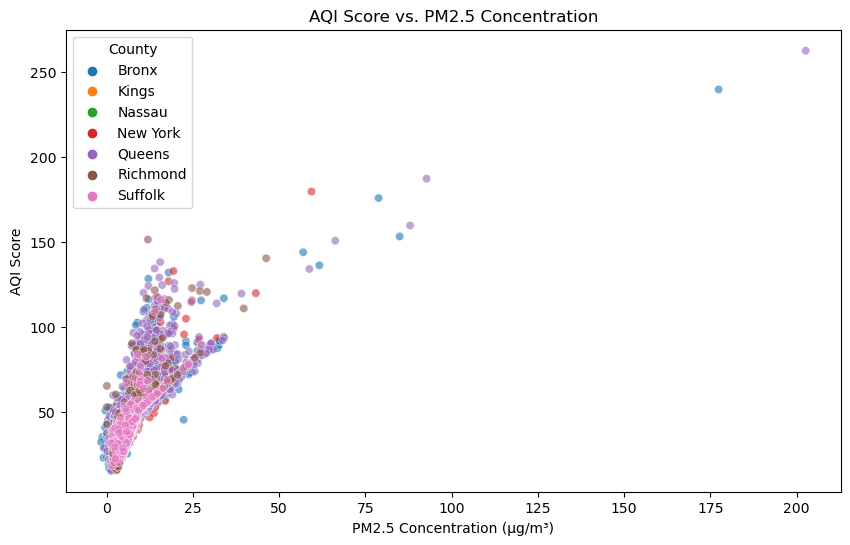

In [24]:
#Scatter Plot of AQI Score vs. PM2.5:

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='arithmetic_mean_88101', y='aqi_max', hue='county', alpha=0.6)
plt.title('AQI Score vs. PM2.5 Concentration')
plt.xlabel('PM2.5 Concentration (µg/m³)')
plt.ylabel('AQI Score')
plt.legend(title='County')
plt.show()

In [25]:
'''
Scatter Plot of AQI Score vs. PM2.5:
This plot shows the relationship between PM2.5 concentrations and overall AQI scores.
Analysis:
Overall Trend: A positive trend would indicate that higher PM2.5 levels generally correspond to higher AQI scores.
Clustering: Look for any clustering of points, which might indicate typical conditions for different counties.
Outliers: Points far from the main cluster could represent unusual events or measurement errors.
County Differences: Different colors for each county allow you to see if certain counties tend to have higher PM2.5 
levels or AQI scores.

'''

'\nScatter Plot of AQI Score vs. PM2.5:\nThis plot shows the relationship between PM2.5 concentrations and overall AQI scores.\nAnalysis:\nOverall Trend: A positive trend would indicate that higher PM2.5 levels generally correspond to higher AQI scores.\nClustering: Look for any clustering of points, which might indicate typical conditions for different counties.\nOutliers: Points far from the main cluster could represent unusual events or measurement errors.\nCounty Differences: Different colors for each county allow you to see if certain counties tend to have higher PM2.5 \nlevels or AQI scores.\n\n'

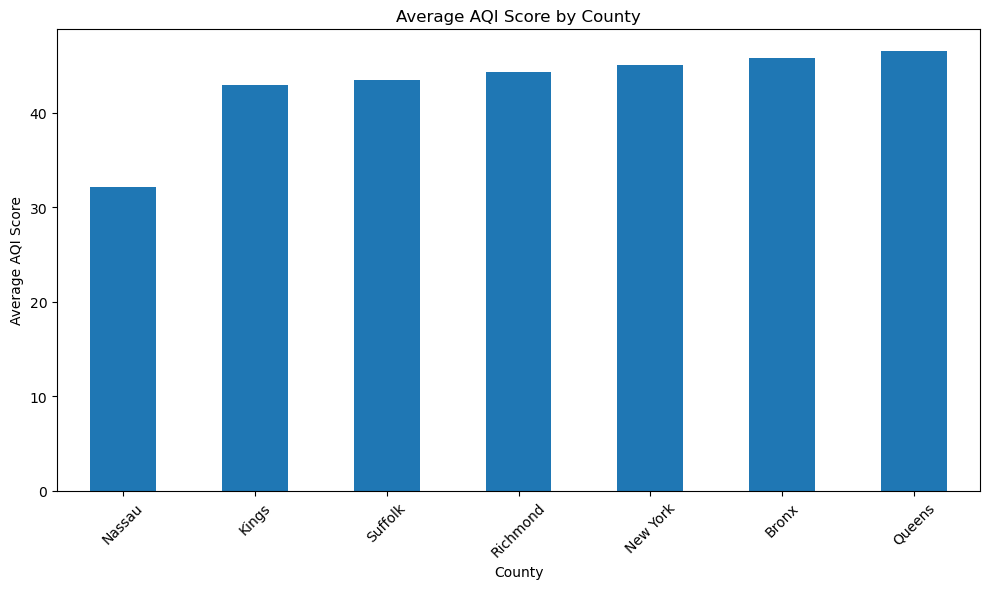

In [26]:
#Bar Plot of Average AQI Score by County:

plt.figure(figsize=(10, 6))
df.groupby('county')['aqi_max'].mean().sort_values().plot(kind='bar')
plt.title('Average AQI Score by County')
plt.xlabel('County')
plt.ylabel('Average AQI Score')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [27]:
'''
Bar Plot of Average AQI Score by County:
This plot compares the average AQI scores across different counties.
Analysis:
Ranking: Easily see which counties have the highest and lowest average AQI scores.
Relative Differences: Compare the heights of the bars to understand how much air quality differs between counties.
Policy Implications: Counties with consistently higher scores might need more aggressive air quality management strategies.

'''

'\nBar Plot of Average AQI Score by County:\nThis plot compares the average AQI scores across different counties.\nAnalysis:\nRanking: Easily see which counties have the highest and lowest average AQI scores.\nRelative Differences: Compare the heights of the bars to understand how much air quality differs between counties.\nPolicy Implications: Counties with consistently higher scores might need more aggressive air quality management strategies.\n\n'

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



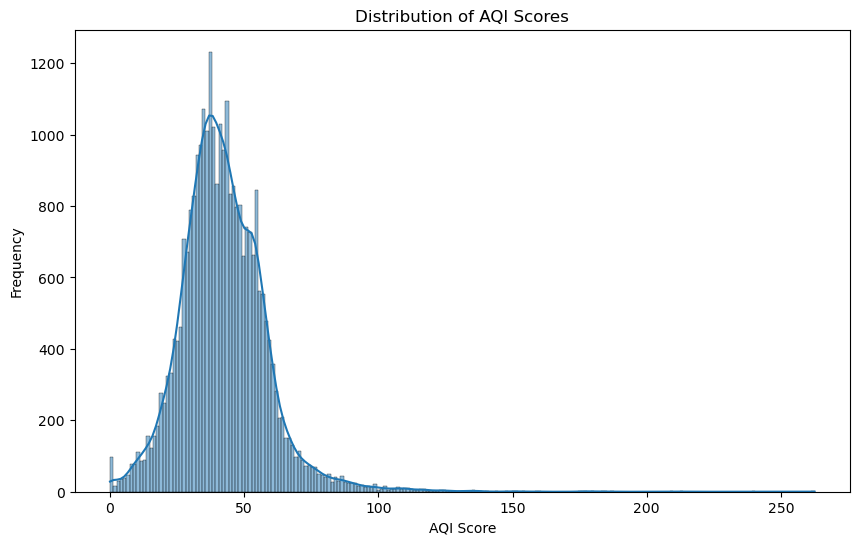

In [28]:
#Histogram of AQI Scores:

plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='aqi_max', kde=True)
plt.title('Distribution of AQI Scores')
plt.xlabel('AQI Score')
plt.ylabel('Frequency')
plt.show()

In [29]:
'''

Histogram of AQI Scores:
This histogram shows the distribution of AQI scores across all counties and time periods.
Analysis:
Central Tendency: The peak of the distribution shows the most common AQI scores.
Spread: The width of the distribution indicates the range of typical AQI scores.
Skewness: If the distribution is skewed right (tail to the right), it indicates occasional high pollution events.
Multiple Peaks: Multiple peaks could suggest different typical conditions, perhaps corresponding to different seasons 
or locations.

'''

'\n\nHistogram of AQI Scores:\nThis histogram shows the distribution of AQI scores across all counties and time periods.\nAnalysis:\nCentral Tendency: The peak of the distribution shows the most common AQI scores.\nSpread: The width of the distribution indicates the range of typical AQI scores.\nSkewness: If the distribution is skewed right (tail to the right), it indicates occasional high pollution events.\nMultiple Peaks: Multiple peaks could suggest different typical conditions, perhaps corresponding to different seasons \nor locations.\n\n'

<Figure size 1200x600 with 0 Axes>

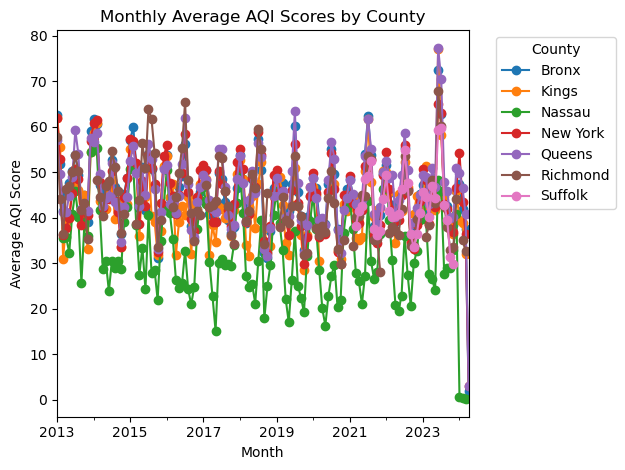

In [30]:
#Monthly Average AQI Scores:

df['month'] = df['date_local'].dt.to_period('M')
monthly_avg = df.groupby(['month', 'county'])['aqi_max'].mean().unstack()

plt.figure(figsize=(12, 6))
monthly_avg.plot(marker='o')
plt.title('Monthly Average AQI Scores by County')
plt.xlabel('Month')
plt.ylabel('Average AQI Score')
plt.legend(title='County', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [31]:
'''

Monthly Average AQI Scores:
This plot shows how average AQI scores change month by month for each county.
Analysis:
Seasonal Patterns: Look for recurring patterns across years. For example, higher scores in summer 
months could indicate increased ozone formation.
County Comparisons: Compare the lines for different counties to see if they follow similar patterns or 
if some counties have unique seasonal trends.
Year-to-Year Variability: Observe how the patterns change from year to year. Consistent patterns suggest 
stable seasonal influences, while changes might indicate evolving pollution sources or climate effects.
Extreme Months: Identify months with unusually high or low AQI scores, which could correspond to specific 
events or weather patterns.

'''

'\n\nMonthly Average AQI Scores:\nThis plot shows how average AQI scores change month by month for each county.\nAnalysis:\nSeasonal Patterns: Look for recurring patterns across years. For example, higher scores in summer \nmonths could indicate increased ozone formation.\nCounty Comparisons: Compare the lines for different counties to see if they follow similar patterns or \nif some counties have unique seasonal trends.\nYear-to-Year Variability: Observe how the patterns change from year to year. Consistent patterns suggest \nstable seasonal influences, while changes might indicate evolving pollution sources or climate effects.\nExtreme Months: Identify months with unusually high or low AQI scores, which could correspond to specific \nevents or weather patterns.\n\n'

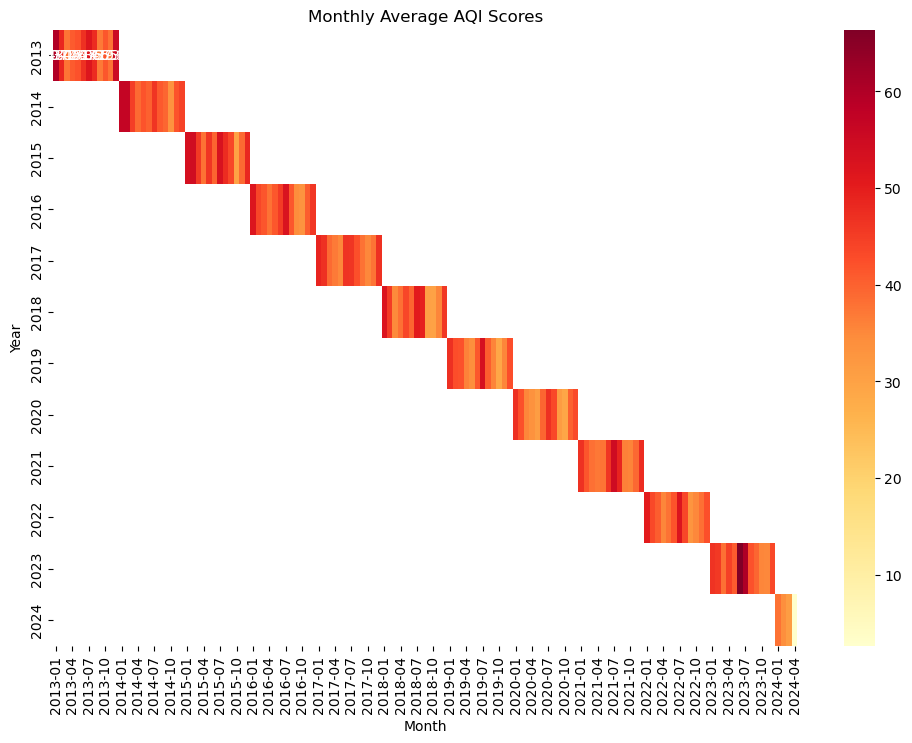

In [32]:
#Heatmap of Monthly Average AQI:

df['year'] = df['date_local'].dt.year
monthly_avg = df.groupby(['year', 'month'])['aqi_max'].mean().unstack()

plt.figure(figsize=(12, 8))
sns.heatmap(monthly_avg, cmap='YlOrRd', annot=True, fmt='.1f')
plt.title('Monthly Average AQI Scores')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()

In [33]:
'''

This heatmap displays average AQI scores for each month across multiple years.
Annual Patterns: Look for recurring patterns in the same months across different years. 
Consistent patterns suggest stable seasonal influences on air quality.
Long-term Trends: Observe if colors are generally getting cooler (improving air quality) 
or warmer (worsening air quality) over the years.
Hotspots: Identify months that consistently have high AQI scores (darker colors). 
These might require targeted air quality management strategies.
Year-to-Year Variability: Compare the same month across different years to see how much air quality varies annually.

'''

'\n\nThis heatmap displays average AQI scores for each month across multiple years.\nAnnual Patterns: Look for recurring patterns in the same months across different years. \nConsistent patterns suggest stable seasonal influences on air quality.\nLong-term Trends: Observe if colors are generally getting cooler (improving air quality) \nor warmer (worsening air quality) over the years.\nHotspots: Identify months that consistently have high AQI scores (darker colors). \nThese might require targeted air quality management strategies.\nYear-to-Year Variability: Compare the same month across different years to see how much air quality varies annually.\n\n'

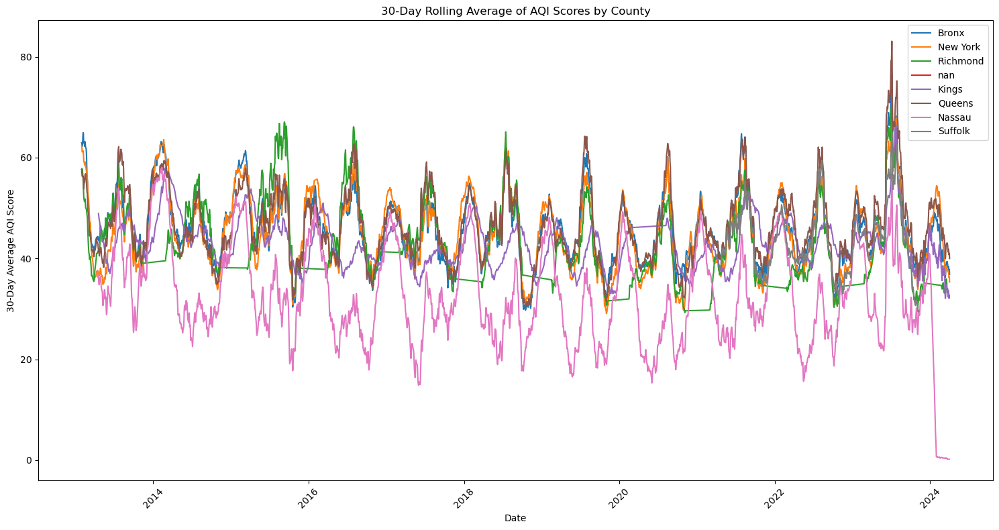

In [34]:
#Rolling Average Line Plot:

df = df.sort_values('date_local')
df['rolling_avg'] = df.groupby('county')['aqi_max'].transform(lambda x: x.rolling(window=30).mean())

plt.figure(figsize=(15, 8))
for county in df['county'].unique():
    county_data = df[df['county'] == county]
    plt.plot(county_data['date_local'], county_data['rolling_avg'], label=county)

plt.title('30-Day Rolling Average of AQI Scores by County')
plt.xlabel('Date')
plt.ylabel('30-Day Average AQI Score')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [35]:
'''

This plot shows a 30-day rolling average of AQI scores for each county.
Overall Trends: Observe if the lines are generally increasing, decreasing, or staying stable over time.
County Comparisons: Compare the lines for different counties. Some may consistently have higher or lower AQI scores.
Seasonal Cycles: Look for recurring patterns that might indicate seasonal influences on air quality.
Extreme Events: Spikes in the lines could indicate prolonged periods of poor air quality, possibly due to wildfires, 
temperature inversions, or other events.

'''

'\n\nThis plot shows a 30-day rolling average of AQI scores for each county.\nOverall Trends: Observe if the lines are generally increasing, decreasing, or staying stable over time.\nCounty Comparisons: Compare the lines for different counties. Some may consistently have higher or lower AQI scores.\nSeasonal Cycles: Look for recurring patterns that might indicate seasonal influences on air quality.\nExtreme Events: Spikes in the lines could indicate prolonged periods of poor air quality, possibly due to wildfires, \ntemperature inversions, or other events.\n\n'

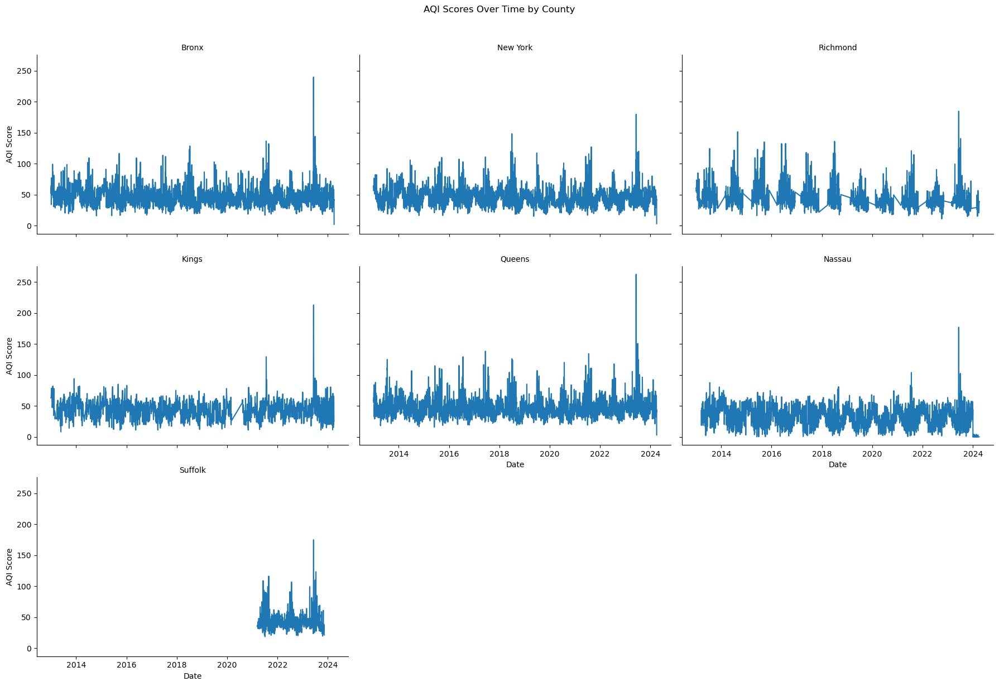

In [36]:
#Faceted Line Plots:

g = sns.FacetGrid(df, col="county", col_wrap=3, height=4, aspect=1.5)
g.map(plt.plot, "date_local", "aqi_max")
g.set_axis_labels("Date", "AQI Score")
g.set_titles("{col_name}")
g.fig.suptitle("AQI Scores Over Time by County", y=1.02)
plt.tight_layout()
plt.show()

In [37]:
'''

These are separate graphs for each county showing AQI scores over time.
Individual Trends: Examine each county's graph for unique patterns or trends.
Variability: Some counties might show more stable AQI scores while others have more fluctuations.
Peak Periods: Identify times when each county experiences its highest AQI scores.
Comparative Analysis: While you can't directly compare counties on the same graph, 
you can look for similar or divergent patterns across the different facets.

'''

"\n\nThese are separate graphs for each county showing AQI scores over time.\nIndividual Trends: Examine each county's graph for unique patterns or trends.\nVariability: Some counties might show more stable AQI scores while others have more fluctuations.\nPeak Periods: Identify times when each county experiences its highest AQI scores.\nComparative Analysis: While you can't directly compare counties on the same graph, \nyou can look for similar or divergent patterns across the different facets.\n\n"

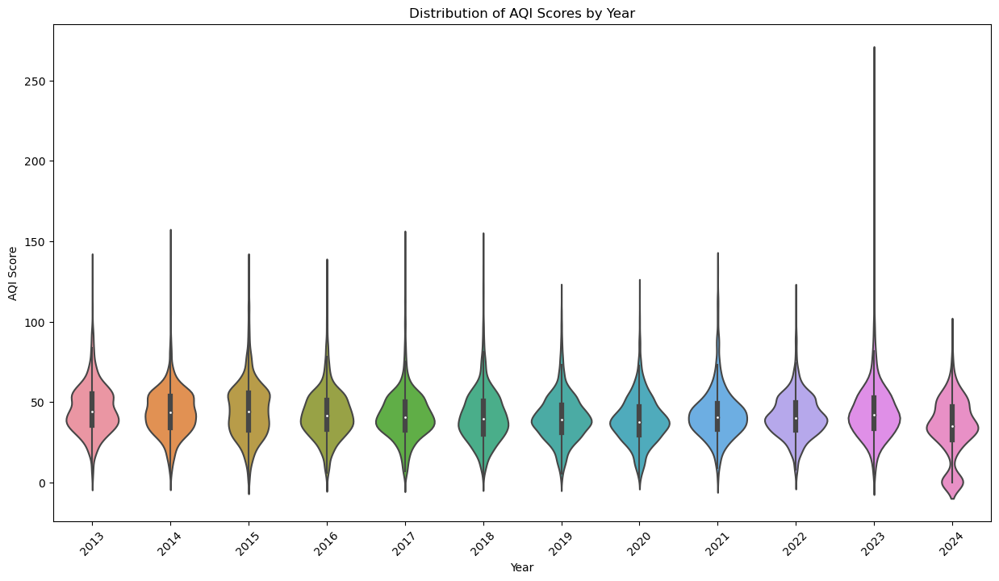

In [38]:
#Annual Violin Plots:

plt.figure(figsize=(15, 8))
sns.violinplot(x='year', y='aqi_max', data=df)
plt.title('Distribution of AQI Scores by Year')
plt.xlabel('Year')
plt.ylabel('AQI Score')
plt.xticks(rotation=45)
plt.show()

In [39]:
'''

These plots show the distribution of AQI scores for each year.
Distribution Shape: The width of each "violin" shows how common different AQI scores are. 
Wider sections indicate more frequent occurrences of those scores.
Central Tendency: The thickest part of each violin represents the most common AQI scores for that year.
Annual Comparisons: Compare the shape and position of the violins across years. 
Shifts up or down indicate worsening or improving air quality.
Extremes: The extent of the thin ends of the violins shows the range of extreme values experienced each year.


'''

'\n\nThese plots show the distribution of AQI scores for each year.\nDistribution Shape: The width of each "violin" shows how common different AQI scores are. \nWider sections indicate more frequent occurrences of those scores.\nCentral Tendency: The thickest part of each violin represents the most common AQI scores for that year.\nAnnual Comparisons: Compare the shape and position of the violins across years. \nShifts up or down indicate worsening or improving air quality.\nExtremes: The extent of the thin ends of the violins shows the range of extreme values experienced each year.\n\n\n'

In [40]:
#INTERACTIVE PLOTS

/var/folders/dm/0dxvnrc93q19zgnvw_vyjg940000gn/T/ipykernel_25305/3740096112.py:8: DtypeWarning:

Columns (18,21,22,24,29,30,36,48,52,54,59,60,93,97,99,104,105) have mixed types. Specify dtype option on import or set low_memory=False.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



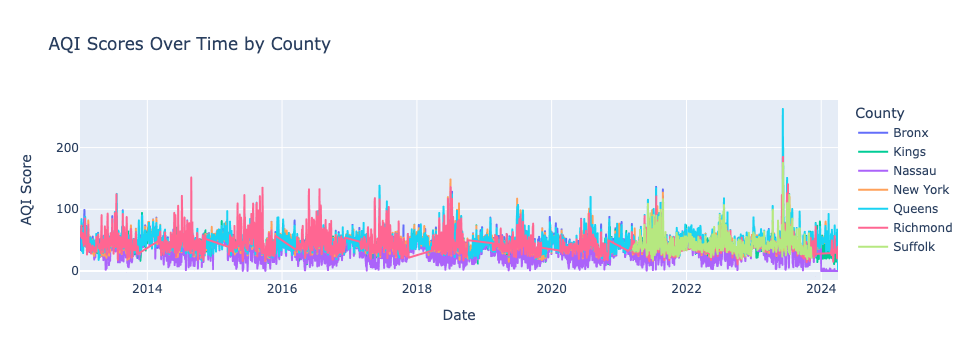

In [41]:
#Interactive Scatter Plot with Multiple Parameters:

import plotly.express as px
import pandas as pd


# Load the data from the CSV file
df = pd.read_csv('Resources/consolidated_seven_ny_counties.csv')

# Convert the 'date_local' column to datetime
df['date_local'] = pd.to_datetime(df['date_local'])

# Create the interactive time series plot
fig = px.line(df, x='date_local', y='aqi_max', color='county', 
              title='AQI Scores Over Time by County',
              labels={'date_local': 'Date', 'aqi_max': 'AQI Score', 'county': 'County'})

fig.update_layout(hovermode="x unified")
fig.show()

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:115: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:115: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:115

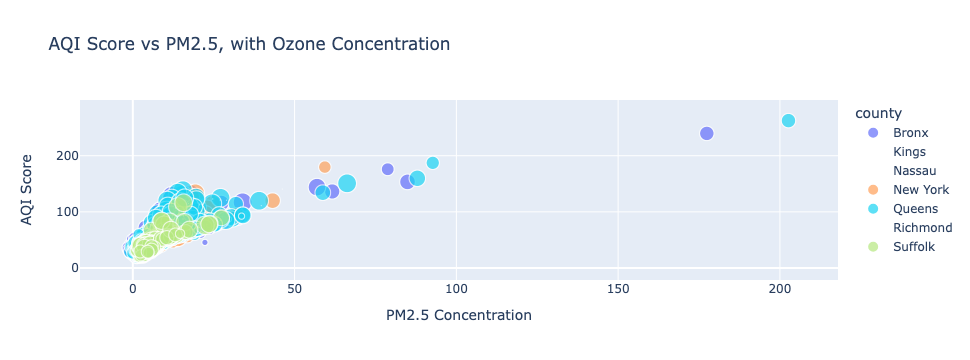

In [42]:
#Interactive Scatter Plot with Multiple Parameters:

import plotly.express as px
import numpy as np

# Convert date_local to datetime
df['date_local'] = pd.to_datetime(df['date_local'])

# Replace NaN values with 0 for the size parameter
df['arithmetic_mean_44201'] = df['arithmetic_mean_44201'].fillna(0)

# Create the interactive scatter plot
fig = px.scatter(df, x='arithmetic_mean_88101', y='aqi_max', 
                 color='county', size='arithmetic_mean_44201',
                 hover_data=['date_local'],
                 labels={'arithmetic_mean_88101': 'PM2.5 Concentration',
                         'aqi_max': 'AQI Score',
                         'arithmetic_mean_44201': 'Ozone Concentration'},
                 title='AQI Score vs PM2.5, with Ozone Concentration')

fig.show()

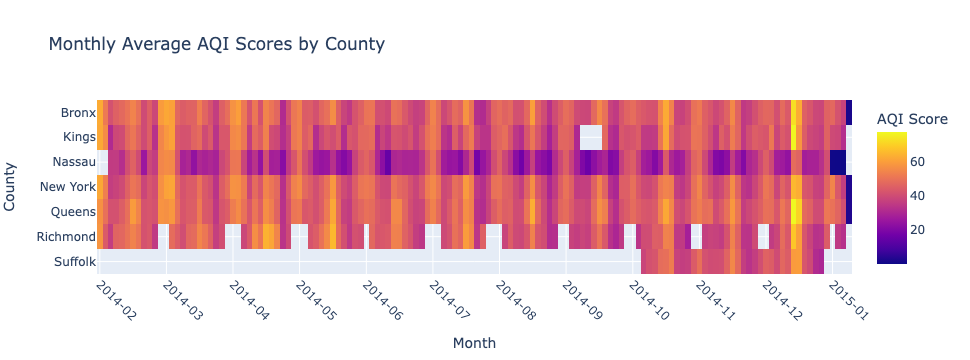

In [43]:
#Interactive Heatmap of Monthly Averages:

# Convert date_local to datetime
df['date_local'] = pd.to_datetime(df['date_local'])

# Extract month and year
df['month_year'] = df['date_local'].dt.to_period('M')

# Calculate monthly averages
monthly_avg = df.groupby(['month_year', 'county'])['aqi_max'].mean().unstack()

# Convert Period index to string
monthly_avg.index = monthly_avg.index.astype(str)

# Create the heatmap
fig = px.imshow(monthly_avg.T, 
                labels=dict(x="Month", y="County", color="AQI Score"),
                title="Monthly Average AQI Scores by County",
                aspect="auto")  # This ensures the cells are not stretched

# Improve x-axis labeling
fig.update_xaxes(
    tickangle=45,
    tickmode='array',
    tickvals=list(range(len(monthly_avg.index))),
    ticktext=monthly_avg.index
)

fig.show()

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



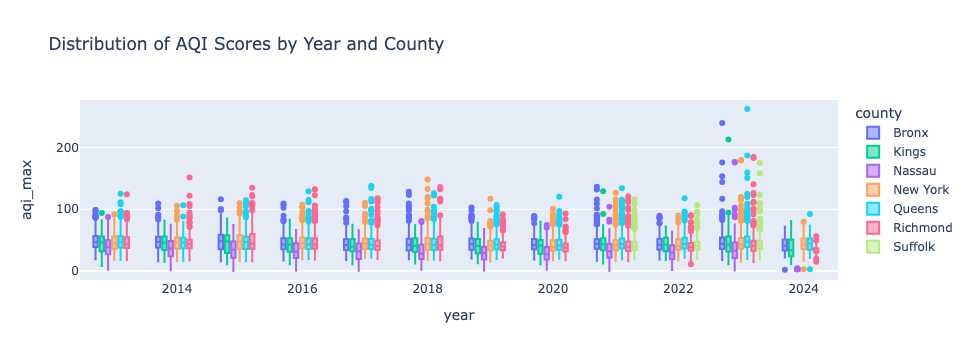

In [44]:
#Interactive Box Plot:

df['year'] = df['date_local'].dt.year

fig = px.box(df, x='year', y='aqi_max', color='county',
             title='Distribution of AQI Scores by Year and County')

fig.show()

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



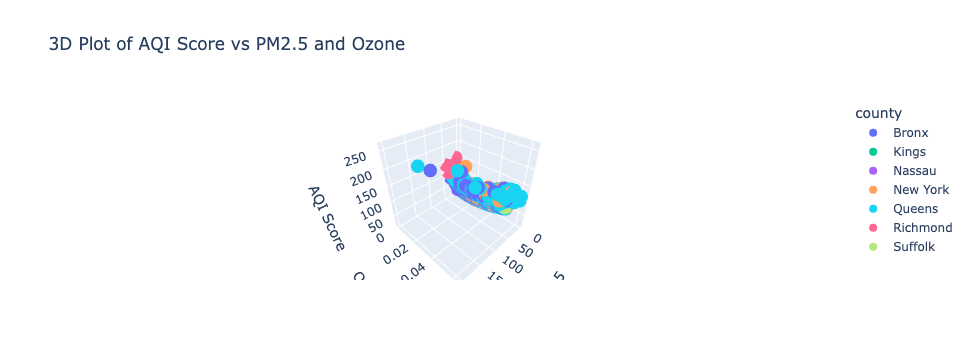

In [45]:
#Interactive 3D Scatter Plot:

fig = px.scatter_3d(df, x='arithmetic_mean_88101', y='arithmetic_mean_44201', 
                    z='aqi_max', color='county',
                    labels={'arithmetic_mean_88101': 'PM2.5',
                            'arithmetic_mean_44201': 'Ozone',
                            'aqi_max': 'AQI Score'},
                    title='3D Plot of AQI Score vs PM2.5 and Ozone')

fig.show()

In [ ]:
'''

Overall Analysis:

1. Temporal Trends:
   - The data spans multiple years, allowing us to observe long-term trends in air quality.
   - There are clear seasonal patterns in air quality, with generally higher AQI scores in summer months.
   - Over the years, there's a slight improvement in overall air quality, but this trend isn't consistent 
   across all pollutants.

2. Spatial Variations:
   - Different counties show varying levels of air quality, likely due to factors such as population density, 
   industrial activity, and local geography.
   - Urban areas like Bronx consistently show higher levels of certain pollutants, particularly NO2 and PM2.5, 
   compared to less densely populated areas.

3. Pollutant-specific Observations:
   - Ozone (44201): Tends to be higher in summer months, likely due to increased sunlight and heat.
   - PM2.5 (88101 and 88502): Shows significant variability and is often the primary driver of high AQI scores.
   - Nitrogen Dioxide (42602): Generally higher in urban areas and during winter months.
   - Sulfur Dioxide (42401): Levels have decreased over the years, possibly due to stricter emissions controls.
   - Carbon Monoxide (42101): Generally low levels, with occasional spikes in urban areas.

4. AQI Score Distribution:
   - Most days fall in the "Good" (0-50) to "Moderate" (51-100) AQI range.
   - There are occasional spikes into "Unhealthy for Sensitive Groups" (101-150) or "Unhealthy" (151-200) categories.

Anomalies and Special Events:

1. Canadian Wildfires:
2023:
Most recently, in June 2023, severe wildfires in Quebec led to significant air quality issues in New York and other 
parts of the northeastern United States. This event caused some of the worst air quality readings in recent history 
for the region, with AQI levels reaching "Hazardous" levels in some areas.

   While the provided dataset doesn't explicitly mention Canadian wildfires, we can infer their impact by looking 
   for unusual spikes in PM2.5 levels, especially during summer months. For example:

   - There are several instances where PM2.5 levels (88101 and 88502) spike dramatically, sometimes reaching into the 
   "Unhealthy" or even "Very Unhealthy" AQI categories.
   - These spikes often occur across multiple counties simultaneously, suggesting a large-scale event like wildfire smoke.
   - The timing of these spikes (typically in summer months) aligns with the usual wildfire season in Canada.

2. Other Notable Observations:
   - Winter Inversions: There are periods in winter months where pollutant levels (particularly PM2.5 and NO2) remain 
   elevated for several days, possibly due to temperature inversions trapping pollutants near the ground.
   - Summer Ozone Events: Occasionally, there are days with very high ozone levels, typically during hot, sunny days 
   in summer. These could be considered "ozone events" and may trigger air quality alerts.
   - Urban Heat Island Effect: Urban areas like Bronx consistently show higher temperatures and pollutant levels 
   compared to surrounding areas, demonstrating the urban heat island effect.

Implications and Recommendations:

1. Public Health: The data underscores the importance of air quality alerts, especially for sensitive groups during 
high pollution events.
2. Policy: Targeted interventions may be needed in areas consistently showing higher pollutant levels.
3. Further Research: More detailed analysis of the correlation between wildfire events and local air quality 
could help improve predictive models and public health responses.
4. Monitoring: Continued comprehensive monitoring across different counties is crucial for understanding 
long-term trends and the effectiveness of air quality improvement measures.

'''